In [2]:
import os, json, requests, re
import shutil
import random
import numpy as np
import cv2
import pandas as pd
from tqdm import tqdm
from torchvision import datasets, transforms, models
from torchvision.models import resnet18, ResNet18_Weights
from torch.utils.data import DataLoader
import glob
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from torchvision.transforms.functional import to_pil_image
from sklearn.model_selection import train_test_split
from urllib.parse import urlparse
from tqdm.auto import tqdm


In [24]:
root_dir = "D:/Project/Action/Action_Image"  # JSON + 이미지들이 있는 상위 폴더
output_base = "D:/Project/Action/processed_dataset"  # 결과 저장 폴더
os.makedirs(output_base, exist_ok=True)

# 비율 설정
train_ratio = 0.64
val_ratio   = 0.16
test_ratio  = 0.20
valid_ext = (".jpg", ".jpeg", ".png")


In [41]:
records = []

label_mapping = {
            "걷거나 뜀": "걷거나 달리는 동작",
            "걷거나 달리는 동작": "걷거나 달리는 동작",
    
            "꼬리를 흔든다": "꼬리를 흔드는 동작",
            "꼬리를 흔드는 동작": "꼬리를 흔드는 동작",
    
            "납작 엎드림": "납작 엎드리는 동작",
            "납작 엎드리는 동작": "납작 엎드리는 동작",

            "배를 보임": "배를 보여주는 동작",
            "배를 보여주는 동작": "배를 보여주는 동작",

            "그루밍함": "그루밍하는 동작",
            "그루밍하는 동작": "그루밍하는 동작",

            "머리를 들이댐": "머리를 들이대는 동작",
            "머리를 들이대는 동작": "머리를 들이대는 동작",

            "발을 숨기고 웅크리고 앉음": "발을 숨기고 웅크리고 앉는 동작",
            "발을 숨기고 웅크리고 앉는 동작": "발을 숨기고 웅크리고 앉는 동작",

            "앞발로 꾹꾹 누름": "앞발로 꾹꾹 누르는 동작",
            "앞발로 꾹꾹 누르는 동작": "앞발로 꾹꾹 누르는 동작",

            "옆으로 누워 있음": "옆으로 눕는 동작",
            "옆으로 눕는 동작": "옆으로 눕는 동작",

            "좌우로 뒹굴음": "좌우로 뒹구는 동작",
            "좌우로 뒹구는 동작": "좌우로 뒹구는 동작",

            "팔을 뻗어 휘적거림": "팔을 뻗어 휘적거리는 동작",
            "앞발을 뻗어 휘적거리는 동작": "팔을 뻗어 휘적거리는 동작",

            "허리를 아치로 세움": "허리를 아치로 세우는 동작",
            "허리를 아치로 세우는 동작": "허리를 아치로 세우는 동작"
        }
def normalize_label(label: str) -> str:
            label = label.strip()                      # 앞뒤 공백 제거
            label = re.sub(r'\s+', ' ', label)         # 중복 공백 제거
            return label_mapping.get(label, label)

for dirpath, _, filenames in os.walk(root_dir):
    json_files   = [f for f in filenames if f.endswith(".json")]
    image_files  = set(f for f in filenames if f.lower().endswith(valid_ext))

    for jf in json_files:
        jp = os.path.join(dirpath, jf)
        try:
            with open(jp, "r", encoding="utf-8") as f:
                data = json.load(f)
        except Exception as e:
            print(f"JSON 읽기 실패: {jp} -> {e}")
            continue
        
        label_raw = data.get("metadata", {}).get("action")
        
        label = normalize_label(label_raw)

        for ann in data.get("annotations", []):
            
            candidates = [os.path.basename(ann.get("frame_url", ""))]
            
            fn, ts = ann.get("frame_number"), ann.get("timestamp")
            if fn is not None and ts is not None:
                for ext in valid_ext:
                    candidates.append(f"frame_{fn}_timestamp_{ts}{ext}")
            
            picked = next((c for c in candidates if c in image_files), None)
            if picked:
                records.append({
                    "image_path": os.path.join(dirpath, picked),
                    "label": label
                })

df = pd.DataFrame(records)
print(f"매칭된 이미지 수: {len(df)}")
if len(df) == 0:
    raise RuntimeError("매칭되는 이미지가 없습니다.")
print(df["label"].value_counts())

매칭된 이미지 수: 53436
label
허리를 아치로 세우는 동작       4453
팔을 뻗어 휘적거리는 동작       4453
앞발로 꾹꾹 누르는 동작        4453
납작 엎드리는 동작           4453
그루밍하는 동작             4453
머리를 들이대는 동작          4453
옆으로 눕는 동작            4453
배를 보여주는 동작           4453
좌우로 뒹구는 동작           4453
발을 숨기고 웅크리고 앉는 동작    4453
꼬리를 흔드는 동작           4453
걷거나 달리는 동작           4453
Name: count, dtype: int64


In [43]:
df_trainval, df_test = train_test_split(df, test_size=test_ratio,
                                        stratify=df["label"], random_state=42)
val_ratio_adj = val_ratio / (train_ratio + val_ratio)
df_train, df_val = train_test_split(df_trainval, test_size=val_ratio_adj,
                                    stratify=df_trainval["label"], random_state=42)

def clean_label(label):
    label = label.strip()
    label = re.sub(r'[<>:"/\\|?*]', '', label)
    return label

def copy_split(df_split, split_name):
    for _, row in tqdm(df_split.iterrows(), total=len(df_split),
                       desc=f"[{split_name}] copying"):
        src        = row["image_path"]
        safe_label = clean_label(row["label"])
        dst_dir    = os.path.join(output_base, split_name, safe_label)
        os.makedirs(dst_dir, exist_ok=True)
        dst = os.path.join(dst_dir, os.path.basename(src))
        try:
            shutil.copy2(src, dst)
        except Exception as e:
            print(f"  -> 복사 실패 {src}: {e}")

copy_split(df_train, "train")
copy_split(df_val,   "val")
copy_split(df_test,  "test")

print("완료  processed_dataset/train | val | test 폴더가 생성되었습니다.")

[train] copying:   0%|          | 0/34198 [00:00<?, ?it/s]

[val] copying:   0%|          | 0/8550 [00:00<?, ?it/s]

[test] copying:   0%|          | 0/10688 [00:00<?, ?it/s]

완료  processed_dataset/train | val | test 폴더가 생성되었습니다.


In [3]:
# 이미지 전처리 및 DataLoader 구성
image_size = 224
batch_size = 32

transform = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)  # RGB 정규화
])

# 데이터셋 경로
base_dir = 'D:/Project/Action/processed_dataset'

train_dataset = datasets.ImageFolder(os.path.join(base_dir, 'train'), transform=transform)
val_dataset = datasets.ImageFolder(os.path.join(base_dir, 'val'), transform=transform)
test_dataset = datasets.ImageFolder(os.path.join(base_dir, 'test'), transform=transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# 클래스 확인
print("Class names:", train_dataset.classes)


Class names: ['걷거나 달리는 동작', '그루밍하는 동작', '꼬리를 흔드는 동작', '납작 엎드리는 동작', '머리를 들이대는 동작', '발을 숨기고 웅크리고 앉는 동작', '배를 보여주는 동작', '앞발로 꾹꾹 누르는 동작', '옆으로 눕는 동작', '좌우로 뒹구는 동작', '팔을 뻗어 휘적거리는 동작', '허리를 아치로 세우는 동작']


In [4]:
# ResNet18 및 클래스 수에 맞게 수정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

weights = ResNet18_Weights.DEFAULT
model = resnet18(weights=weights)

num_classes = len(train_dataset.classes)

model.fc = nn.Linear(model.fc.in_features, num_classes)

model = model.to(device)

print(f"Model ready. Number of output classes: {num_classes}")


Model ready. Number of output classes: 12


In [5]:
print("torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("Current device:", device)
if torch.cuda.is_available():
    print("CUDA device count:", torch.cuda.device_count())
    print("GPU name:", torch.cuda.get_device_name(0))
else:
    print("CUDA not available. Running on CPU.")

torch version: 2.5.1
CUDA available: True
Current device: cuda
CUDA device count: 1
GPU name: NVIDIA GeForce RTX 2080


In [6]:
# 학습 준비
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(model.parameters(), lr=1e-4)

# 필요 시 학습률 스케줄러 추가
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

print("Loss, optimizer, scheduler are ready.")


Loss, optimizer, scheduler are ready.


In [7]:
num_epochs = 10

train_losses, val_losses   = [], []
val_accuracies, lr_history = [], []

for epoch in range(num_epochs):
    # ───────────── Train ─────────────
    model.train()
    running_loss = 0.0
    n_train_batches = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss   += loss.item()
        n_train_batches += 1

    scheduler.step()
    lr_history.append(optimizer.param_groups[0]["lr"])
    avg_train_loss = running_loss / n_train_batches
    train_losses.append(avg_train_loss)

    #
    model.eval()
    val_running_loss = 0.0
    n_val_batches    = 0
    correct, total   = 0, 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()
            n_val_batches += 1

            _, predicted = torch.max(outputs, 1)
            total   += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_val_loss = val_running_loss / n_val_batches
    val_losses.append(avg_val_loss)

    val_acc = 100 * correct / total
    val_accuracies.append(val_acc)

    print(f"Epoch [{epoch+1}/{num_epochs}]  "
          f"TrainLoss {avg_train_loss:.4f} | ValLoss {avg_val_loss:.4f} | "
          f"ValAcc {val_acc:.2f}% | LR {lr_history[-1]:.6f}")


Epoch [1/10]  TrainLoss 0.8575 | ValLoss 0.3592 | ValAcc 91.20% | LR 0.000100
Epoch [2/10]  TrainLoss 0.1003 | ValLoss 0.2028 | ValAcc 94.99% | LR 0.000100
Epoch [3/10]  TrainLoss 0.0178 | ValLoss 0.1682 | ValAcc 95.59% | LR 0.000100
Epoch [4/10]  TrainLoss 0.0077 | ValLoss 0.1611 | ValAcc 95.55% | LR 0.000100
Epoch [5/10]  TrainLoss 0.0048 | ValLoss 0.1592 | ValAcc 95.62% | LR 0.000050
Epoch [6/10]  TrainLoss 0.0035 | ValLoss 0.1575 | ValAcc 95.68% | LR 0.000050
Epoch [7/10]  TrainLoss 0.0030 | ValLoss 0.1598 | ValAcc 95.52% | LR 0.000050
Epoch [8/10]  TrainLoss 0.0025 | ValLoss 0.1555 | ValAcc 95.59% | LR 0.000050
Epoch [9/10]  TrainLoss 0.0022 | ValLoss 0.1552 | ValAcc 95.43% | LR 0.000050
Epoch [10/10]  TrainLoss 0.0019 | ValLoss 0.1518 | ValAcc 95.71% | LR 0.000025


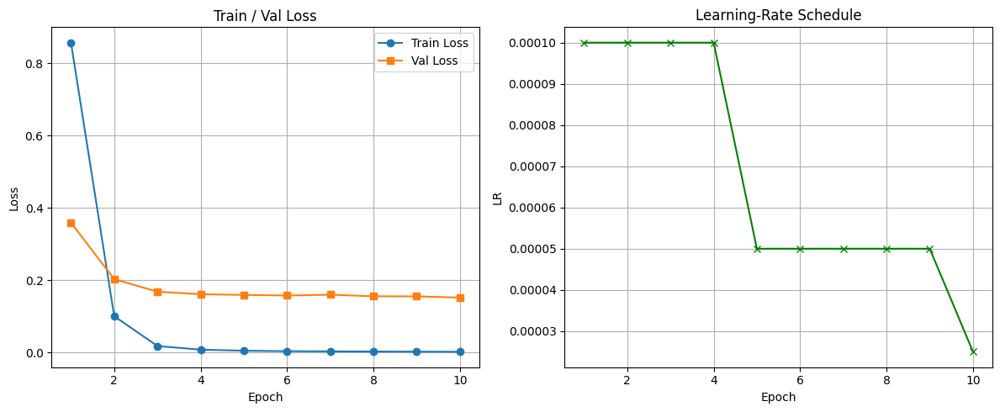

In [8]:
epochs = range(1, len(train_losses)+1)
plt.figure(figsize=(12,5))

# ── Loss ─────────────────
plt.subplot(1,2,1)
plt.plot(epochs, train_losses, marker='o', label='Train Loss')
plt.plot(epochs, val_losses,   marker='s', label='Val Loss')
plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.title('Train / Val Loss')
plt.legend(); plt.grid(True)

# ── Learning Rate ────────
plt.subplot(1,2,2)
plt.plot(epochs, lr_history, marker='x', color='green')
plt.xlabel('Epoch'); plt.ylabel('LR'); plt.title('Learning-Rate Schedule')
plt.grid(True)

plt.tight_layout(); plt.show()


In [9]:
model.eval()
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_acc = 100 * correct / total
print(f"Test Accuracy: {test_acc:.2f}%")


Test Accuracy: 96.08%


In [ ]:
from sklearn.metrics import classification_report

model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:  # 또는 test_loader
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# 클래스 이름 리스트 (ImageFolder 기준)
class_names = train_dataset.classes

report = classification_report(all_labels, all_preds, target_names=class_names, digits=4)
print(report)


                   precision    recall  f1-score   support

       걷거나 달리는 동작     0.9099    0.9444    0.9268       342
         그루밍하는 동작     0.9828    0.6129    0.7550        93
       꼬리를 흔드는 동작     0.9619    0.9893    0.9754       281
       납작 엎드리는 동작     0.9309    0.9841    0.9568       315
      머리를 들이대는 동작     0.9606    0.9710    0.9658       276
발을 숨기고 웅크리고 앉는 동작     0.9700    0.9737    0.9719       266
       배를 보여주는 동작     0.9745    0.9889    0.9816       270
    앞발로 꾹꾹 누르는 동작     0.9778    1.0000    0.9888       353
        옆으로 눕는 동작     0.9803    0.9836    0.9819       304
       좌우로 뒹구는 동작     0.9615    0.9549    0.9582       288
   팔을 뻗어 휘적거리는 동작     0.9836    0.9639    0.9736       249
   허리를 아치로 세우는 동작     0.8843    0.7926    0.8359       135

         accuracy                         0.9571      3172
        macro avg     0.9565    0.9299    0.9393      3172
     weighted avg     0.9574    0.9571    0.9557      3172



In [13]:
from sklearn.metrics import f1_score
f1_micro = f1_score(all_labels, all_preds, average='micro')
print(f"F1 Score (Micro):    {f1_micro:.4f}")

F1 Score (Micro):    0.9571


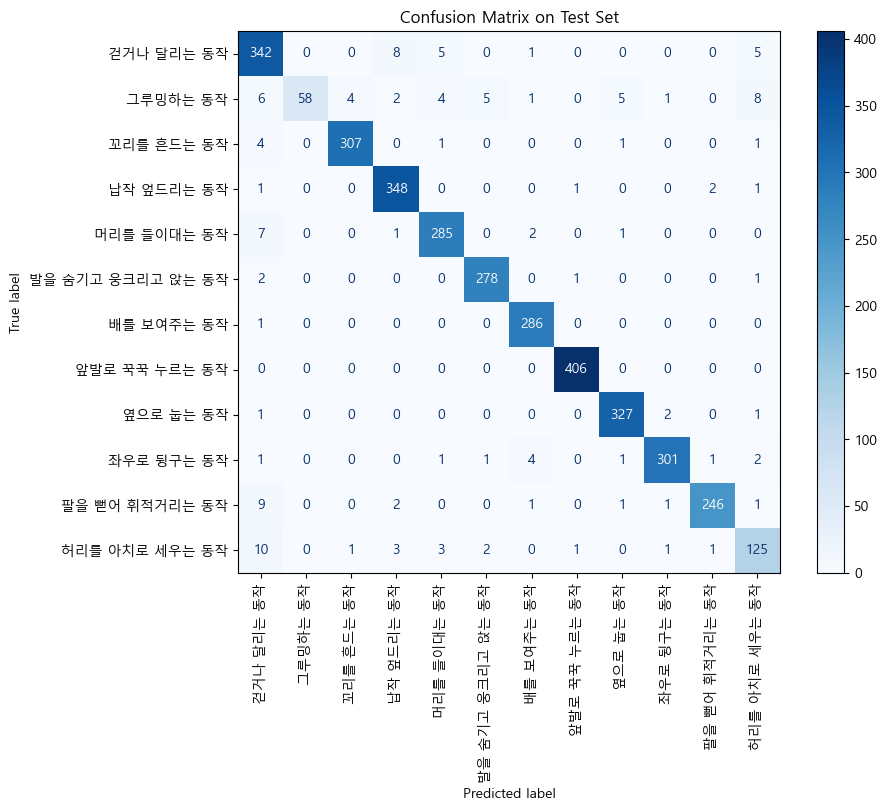

In [10]:
# Confusion Matrix
from matplotlib import font_manager, rc

model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())

class_names = test_dataset.classes

font_path = "C:/Windows/Fonts/malgun.ttf"  # '맑은 고딕'
font_name = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font_name)
plt.rcParams['axes.unicode_minus'] = False

cm = confusion_matrix(all_labels, all_preds)

fig, ax = plt.subplots(figsize=(10, 8))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap='Blues', ax=ax, xticks_rotation=90)
plt.tight_layout()
plt.title("Confusion Matrix on Test Set")
plt.show()

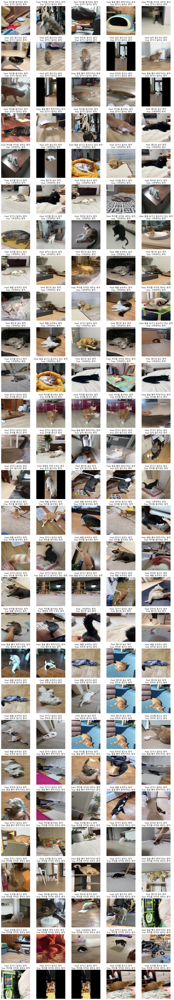

In [60]:
# 잘못 분류된 이미지 시각화
model.eval()
misclassified_images = []
misclassified_preds = []
misclassified_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        mismatches = predicted != labels
        if mismatches.any():
            for img, pred, label in zip(images[mismatches], predicted[mismatches], labels[mismatches]):
                misclassified_images.append(img.cpu())
                misclassified_preds.append(pred.item())
                misclassified_labels.append(label.item())

num_show = len(misclassified_images)
cols = 5
rows = (num_show + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(15, 3 * rows))
axes = axes.flatten()

for i in range(num_show):
    img = misclassified_images[i]
    img = img.permute(1, 2, 0) * 0.5 + 0.5
    pred = test_dataset.classes[misclassified_preds[i]]
    label = test_dataset.classes[misclassified_labels[i]]
    ax = axes[i]
    ax.imshow(img.numpy())
    ax.set_title(f"Pred: {pred}\nTrue: {label}")
    ax.axis('off')

for j in range(num_show, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

c:\Users\roux\miniconda3\envs\torch310\lib\site-packages\torch\nn\modules\module.py:1827: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


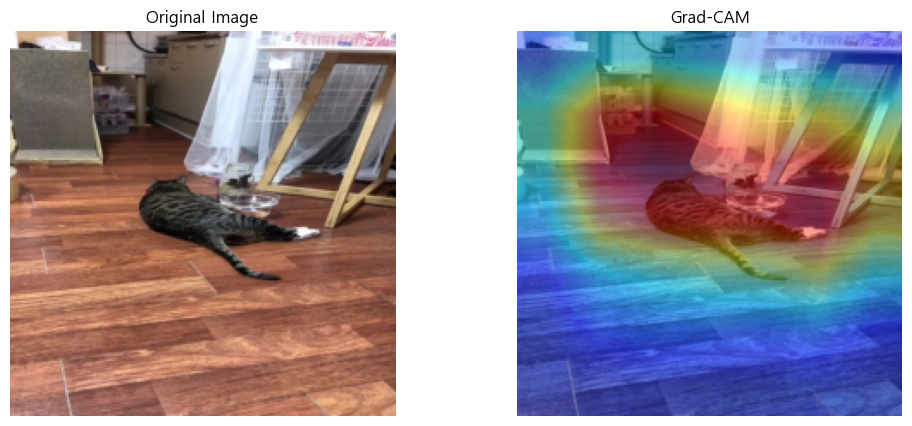

In [61]:
# Grad-CAM
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_layers()

    def hook_layers(self):
        def forward_hook(module, input, output):
            self.activations = output.detach()

        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def generate(self, input_tensor, target_class=None):
        self.model.eval()
        input_tensor = input_tensor.unsqueeze(0).to(device)

        output = self.model(input_tensor)
        if target_class is None:
            target_class = output.argmax(dim=1).item()

        self.model.zero_grad()
        output[0, target_class].backward()

        pooled_gradients = self.gradients.mean(dim=[0, 2, 3])
        activations = self.activations[0]
        for i in range(activations.shape[0]):
            activations[i, :, :] *= pooled_gradients[i]
        heatmap = activations.mean(dim=0).cpu().numpy()
        heatmap = np.maximum(heatmap, 0)
        heatmap /= np.max(heatmap)
        return heatmap

target_layer = model.layer4[1].conv2
grad_cam = GradCAM(model, target_layer)

sample_img, _ = test_dataset[0]
heatmap = grad_cam.generate(sample_img)

img = sample_img.permute(1, 2, 0).cpu().numpy() * 0.5 + 0.5
img = np.uint8(255 * img)
heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap_colored = cv2.applyColorMap(np.uint8(255 * heatmap_resized), cv2.COLORMAP_JET)
superimposed = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(superimposed[..., ::-1])  # BGR to RGB
plt.title("Grad-CAM")
plt.axis('off')
plt.show()

In [62]:
# 저장
model_path = "D:/Project/Action/resnet18_cat_action.pt"
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")

Model saved to D:/Project/Action/resnet18_cat_action.pt
